## Use Librosa to generate some Mel Spectrograms

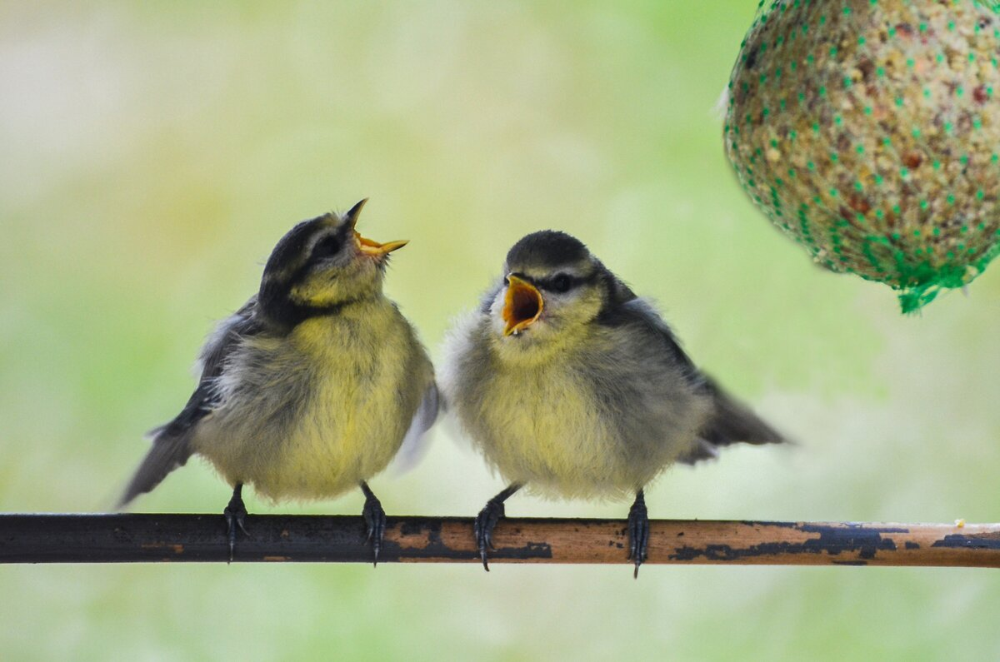

In [43]:
import warnings
warnings.filterwarnings('ignore')

import os
import random
import pandas as pd
import numpy as np
from tqdm import tqdm
import librosa
import librosa.display
from IPython.display import Audio
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
from scipy import signal

## Spectrograms

In [44]:
audio_train = '/kaggle/input/birdclef-2024/train_audio'
image_train = 'kaggle/working/train_images'
df = pd.read_csv('/kaggle/input/birdclef-2024/eBird_Taxonomy_v2021.csv')
df.head(2)

,TAXON_ORDER,CATEGORY,SPECIES_CODE,PRIMARY_COM_NAME,SCI_NAME,ORDER1,FAMILY,SPECIES_GROUP,REPORT_AS
0,1,species,ostric2,Common Ostrich,Struthio camelus,Struthioniformes,Struthionidae (Ostriches),Ostriches,NaN
1,6,species,ostric3,Somali Ostrich,Struthio molybdophanes,Struthioniformes,Struthionidae (Ostriches),NaN,NaN


In [45]:
songs_birds = pd.read_csv('/kaggle/input/birdclef-2024/train_metadata.csv')
songs_birds.head(2)

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
0,asbfly,[],['call'],39.2297,118.1987,Muscicapa dauurica,Asian Brown Flycatcher,Matt Slaymaker,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/134896,asbfly/XC134896.ogg
1,asbfly,[],['song'],51.4030,104.6401,Muscicapa dauurica,Asian Brown Flycatcher,Magnus Hellström,Creative Commons Attribution-NonCommercial-Sha...,2.5,https://www.xeno-canto.org/164848,asbfly/XC164848.ogg


In [46]:
def show_example(example, path, sig, sr):
    
    print(example, '\n____________\n')
    
    librosa.get_samplerate(path)
    display(Audio(path, rate=sampling_rate))
    
    fig, (ax0, ax1) = plt.subplots(2, 1, figsize=(12, 6))
    ax0.plot(sig)
    ax0.set_title('plot')
    librosa.display.waveshow(sig, sr=sr, ax=ax1, color='paleturquoise')
    ax1.set_title('librosa.display.waveshow')
    plt.tight_layout()
    plt.show()


Поскольку мы не можем видеть звук, это помогает найти способы его визуализировать. Например, осциллограммы показывают пики и спады давления воздуха с течением времени — чем выше давление воздуха, тем громче звук. Для простых звуков мы также можем видеть различия в высоте волны: более широко разделенные пики указывают на более медленный, более длинноволновый и более низкий звук.
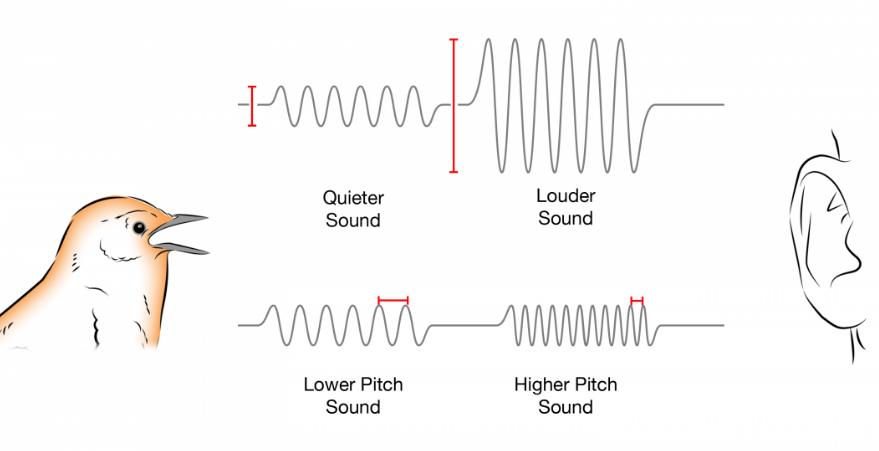

primary_label                                                  comgre
secondary_labels                                                   []
type                                                             ['']
latitude                                                      50.6041
longitude                                                      5.6641
scientific_name                                      Tringa nebularia
common_name                                         Common Greenshank
author                                              Chèvremont Fabian
license             Creative Commons Attribution-NonCommercial-Sha...
rating                                                            4.0
url                                     https://xeno-canto.org/742957
filename                                          comgre/XC742957.ogg
Name: 5149, dtype: object 
____________



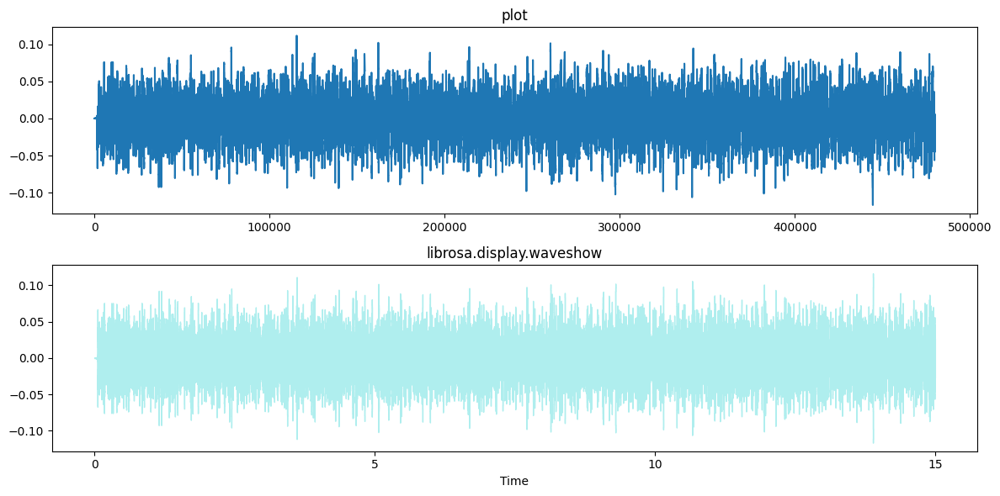

In [47]:
random_num = random.randint(0, songs_birds.shape[0])
example = songs_birds.loc[random_num]
path = '/kaggle/input/birdclef-2024/train_audio/'+example.filename
sampling_rate = 32000
sig, sr = librosa.load(path, sr=sampling_rate, duration=15)

show_example(example, path, sig, sr)

Звуки могут быть представлены в форме волн, и волны имеют два важных свойства: частоту и амплитуду, как показано на рисунке. Частота определяет высоту звука, амплитуда — его громкость.

In [48]:
def show_spectrum(sig, sr):
    
    fft = np.fft.fft(sig)
    magnitude = np.abs(fft) 

    f = np.linspace(0,sr,len(magnitude))

    left_spectrum = magnitude[:int(len(magnitude) / 2)]
    left_f = f[:int(len(magnitude) / 2)]

    fig, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(12, 4))
    
    ax1.plot(left_f, left_spectrum, color='paleturquoise')
    ax1.set_title('Power spectrogram')
    plt.xlabel('Frequency')
    plt.ylabel('Magnitude')
    
    S = np.abs(librosa.stft(sig))
    img = librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max), y_axis='log', x_axis='time', ax=ax2, cmap='YlGnBu')
    ax2.set_title('Power spectrogram')
    fig.colorbar(img, ax=ax2, format="%+2.0f dB")
    
    

Спектрограммы добавляют еще одно очень полезное измерение к визуализации звука, показывая изменения высоты тона и громкости с течением времени. Спектрограммы могут быть разных цветов, но обычно чем ярче цвет, тем громче звук.
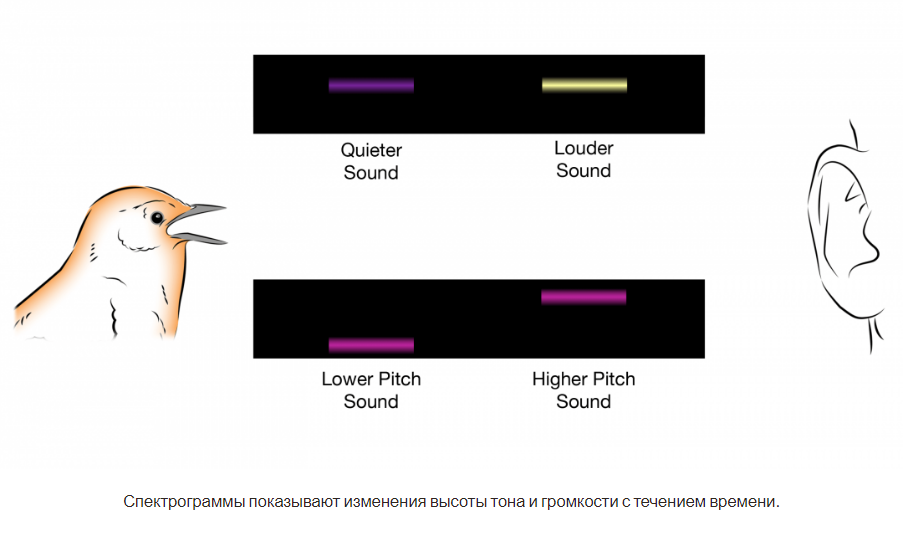

На спектрограмме аудио горизонтальное направление представляет время, а вертикальное направление представляет частоты. Наконец, амплитуда звуков определённой частоты, существующих в определённый момент, представлена цветом точки, который обозначается соответствующими координатами x-y.
Преобразование Фурье расбивает функцию времени (сигнал) на составляющие частоты. Точно так же, как музыкальный аккорд может быть выражен громкостью и частотами составляющих его нот, преобразование Фурье, применённое к функции, отображает амплитуду каждой частоты, присутствующей в базовой функции (сигналу). На втором графике три шкалы – время к частоте, что интуитивно понятно, и дополнительная шкала децибел, показывающая плотность, мощность сигнала на определённой частоте в определённый промежуток времени.

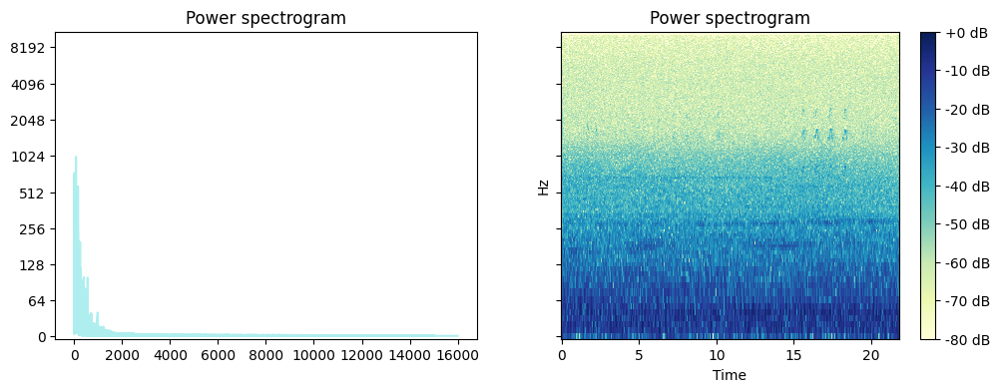

In [49]:
show_spectrum(sig, sr)

Спектрограммы позволяют сразу увидеть структуру песен. Восточный лесной пиви (Contopus vireos) издает такой пронзительный свист, что его трудно распознать на слух, но форма буквы «М», которую он создает на спектрограмме, незабываема.
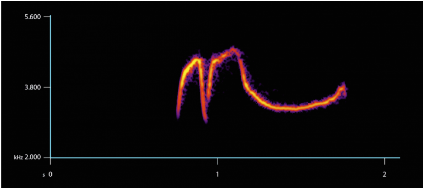

Спектрограммы также могут выявить скрытые сложности пения птиц. Вири (Catharus fuscescens) поет потустороннюю песню, которую еще больше можно оценить, если увидеть ее на спектрограмме. Если вы присмотритесь, вы увидите, что Veery объединяет в себе питч-свипы и мини-трели, создавая впечатляющие вокальные эффекты, напоминающие флейту.

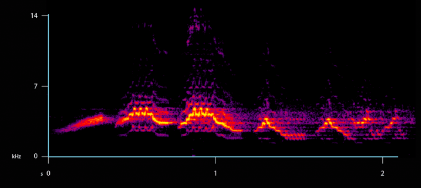

Получим спекторграмму и разложим ее на компоненты величины (S) и фазы (P), так что D = S * P.
Далее компоненты величины разложим на матрицу компонентов (базисных элементов) и преобразованную матрицу/матрицу активации на 16 компонентов. 


In [50]:
def log_specgram(sig, sr, window_size=20, step_size=10, eps=1e-10):
    nperseg = int(round(window_size * sr / 1e3))
    noverlap = int(round(step_size * sr / 1e3))
    freqs, times, spec = signal.spectrogram(sig, fs=sr, window='hann',
                                            nperseg=nperseg, noverlap=noverlap, detrend=False)
    return freqs, times, np.log(spec.T.astype(np.float32) + eps)

In [51]:
def show_spectrum_decompose(sig, sr):

    frequencies, _, D = librosa.reassigned_spectrogram(sig, sr=sr)
    S, phase = librosa.magphase(D)
    components, activations = librosa.decompose.decompose(S, n_components=16, sort=True)
    plt.figure(figsize=(12,4))

    plt.subplot(1,2,1)
    librosa.display.specshow(librosa.amplitude_to_db(components, ref=np.max), y_axis='log', cmap='YlGnBu')
    plt.xlabel('Component')
    plt.ylabel('Frequency')
    plt.title('Components')

    plt.subplot(1,2,2)
    librosa.display.specshow(activations, x_axis='time', cmap='YlGnBu')
    plt.xlabel('Time')
    plt.ylabel('Component')
    plt.title('Activations')

    plt.tight_layout()

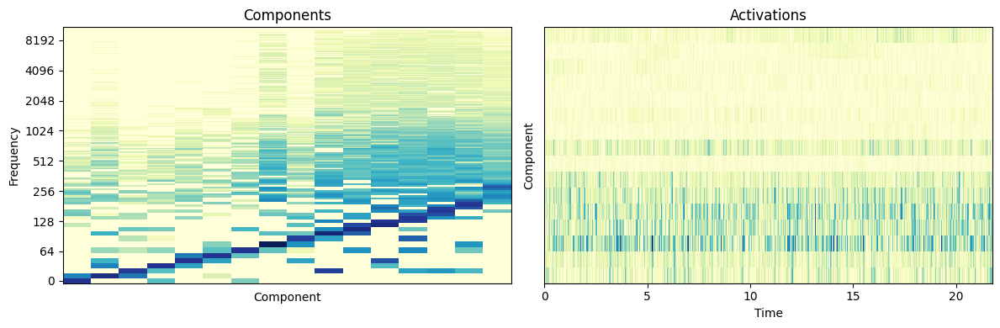

In [52]:
show_spectrum_decompose(sig, sr)

In [53]:
def show_spectrum_3d(sig, sr):
    plt.figure(figsize=(12,8))
    freqs, times, spectrogram = log_specgram(sig, sr)
    data = [go.Surface(z=spectrogram.T, colorscale='YlGnBu',)]
    layout = go.Layout(height=600, width=1000, title='Specgtogram 3d')
    fig = go.Figure(data=data, layout=layout)
    py.iplot(fig)

In [10]:
#show_spectrum_3d(sig, sr)

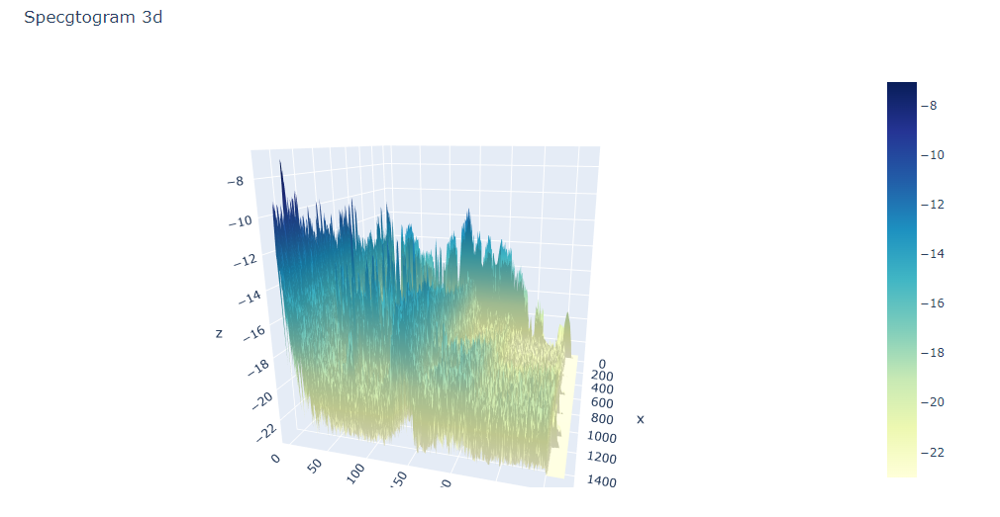

Cпектрограмма, полученная применением преобразования Фурье к аудиосигналу позволяет «увидеть» как насыщены определённые частоты в аудиосигнале. Здесь синие пики - верхние амплитуды, желтые - нижние. Так, если сложить все «срезы» трёхмерного представления и «насыщенность» областей отразить цветом, то получится цветное двухмерное представление. Спектрограммы полезны, потому что они показывают именно ту информацию, которая нам нужна: частоты, особенности, которые формируют форму слышимого нами звука. Разные виды птиц и все издающие звуки объекты имеют свой собственный уникальный частотный диапазон, поэтому звуки кажутся разными. Наша модель просто должна научиться различать частоты, чтобы достичь идеальных результатов классификации. 

STFT-спектрограммы - Вычисляет распределение насышенности сигнала в объединенной частотно-временной области, используя алгоритм кратковременного преобразования Фурье (STFT). Но получается слишком однородной (см. график слева). При преобразовании в децибелы (дБ) шкала становится логарифмической. Это ограничивает числовой диапазон примерно до 0–120 дБ. Интенсивность цветов на графике более точно соответствует тому, что мы слышим, чем если бы использовалась линейная шкала.

In [54]:
def show_spectrum_stft(sig, sr):
    hop_length, n_fft = 224, 1024

    hop_length_duration = float(hop_length) / sr
    n_fft_duration = float(n_fft) / sr
    stft = librosa.stft(sig, n_fft=n_fft, hop_length=hop_length)
    spectrogram = np.abs(stft)

    fig, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(12, 4))
    img = librosa.display.specshow(spectrogram, sr=sr, hop_length=hop_length, cmap='YlGnBu')
    fig.colorbar(img, ax=ax1, format="%+2.0f dB")
    ax1.set_title('STFT Spectrogram (dB)')


    magnitude = np.abs(stft)
    log_spectrogram = librosa.amplitude_to_db(magnitude)
    img = librosa.display.specshow(log_spectrogram, sr=sr, hop_length=hop_length, cmap='YlGnBu')

    fig.colorbar(img, ax=ax2, format="%+2.0f dB")
    ax2.set_title('Log Spectrogram (dB)')
    
    fig.text(0.5, 0.04, 'Time', ha='center', va='center')
    fig.text(0.06, 0.5, 'Frequency', ha='center', va='center', rotation='vertical')

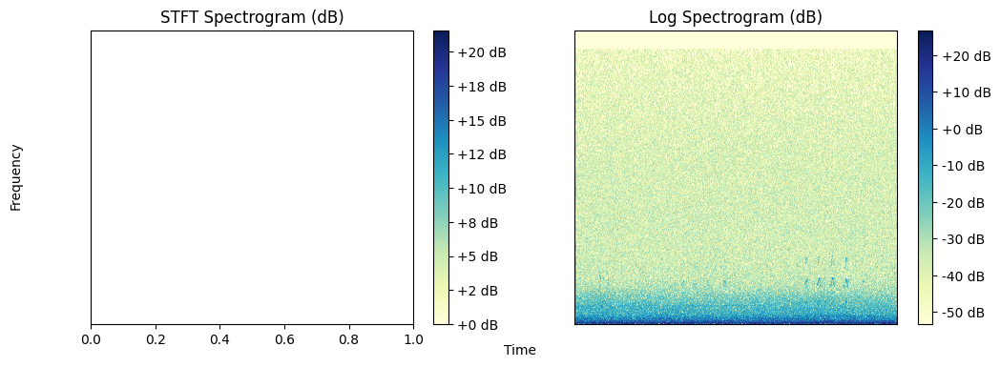

In [55]:
show_spectrum_stft(sig, sr)

Мел — психофизическая единица высоты звука, применяется главным образом в музыкальной акустике. Название происходит от слова «мелодия». Количественная оценка звука по высоте основана на статистической обработке большого числа данных о субъективном восприятии высоты звуковых тонов.
Где sig обозначает необработанные данные волны, sr обозначает частоту дискретизации аудио-сэмпла, а n_mels определяет количество полос мел в сгенерированной спектрограмме.

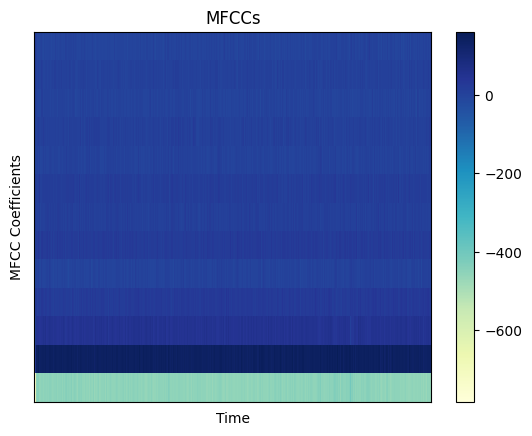

In [56]:
def show_spectrum_mfccs(sig, sr):
    hop_length, n_fft = 224, 1024
    
    MFCCs = librosa.feature.mfcc(y=sig, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mfcc=13)
    plt.figure()
    librosa.display.specshow(MFCCs, sr=sr, hop_length=hop_length, cmap='YlGnBu')
    plt.xlabel('Time')
    plt.ylabel('MFCC Coefficients')
    plt.colorbar()
    plt.title('MFCCs')
    
show_spectrum_mfccs(sig, sr)

## Augmentation

In [57]:
def noising(data,noise_factor):
    """
    Add noise to original data.
    Adjust noise factor how much you want to add.
    """
    noise = np.random.randn(len(data))
    augmented_data = data + noise_factor * noise
    # Cast back to same data type
    augmented_data = augmented_data.astype(type(data[0]))
    return augmented_data

def shifting(data, sampling_rate, shift_max, shift_direction):
    shift = np.random.randint(sampling_rate * shift_max+1)
    if shift_direction == 'right':
        shift = -shift
    elif shift_direction == 'both':
        direction = np.random.randint(0, 2)
        if direction == 1:
            shift = -shift
    augmented_data = np.roll(data, shift)
    # Set to silence for heading/ tailing
    if shift > 0:
        augmented_data[:shift] = 0
    else:
        augmented_data[shift:] = 0
    return augmented_data

def change_pitch(data, sampling_rate, pitch_factor):
    return librosa.effects.pitch_shift(y=data, sr=sampling_rate, n_steps=pitch_factor)

def pitch_speed(data, low=0.8, high = 1):
    augmented_data = data.copy() 
    length_change = np.random.uniform(low=low, high = high) #change low and high here
    speed_fac = 1.0  / length_change
    tmp = np.interp(np.arange(0, len(augmented_data), speed_fac), np.arange(0, len(augmented_data)), augmented_data)
    minlen = min(data.shape[0], tmp.shape[0])
    augmented_data *= 0
    augmented_data[0:minlen] = tmp[0:minlen]
    return augmented_data

def change_speed(data, low=0.9, high = 1.1):
    augmented_data = data.copy() 
    speed_change = np.random.uniform(low=low, high=high)
    tmp = librosa.effects.time_stretch(y = augmented_data.astype('float64'), rate=speed_change)
    minlen = min(augmented_data.shape[0], tmp.shape[0])
    augmented_data *= 0 
    augmented_data[0:minlen] = tmp[0:minlen]
    return augmented_data

def value_aug(data, low=1.5, high=3):
    dyn_change = np.random.uniform(low=low, high=high)
    augmented_data = data * dyn_change
    return augmented_data

def hpss(data):
    augmented_data = librosa.effects.hpss(data.astype('float64')) 
    return augmented_data[1]

def streching(data, rate=1.1):
    input_length = len(data) 
    augmented_data = librosa.effects.time_stretch(y=data.astype('float'), rate=1.1)
    if len(augmented_data) > input_length:
        augmented_data = augmented_data[:input_length]
    else:
        augmented_data = np.pad(augmented_data, (0, max(0, input_length - len(augmented_data))), 'constant')
    return augmented_data

In [58]:
noising_ = noising(sig, np.random.uniform(0,0.1))
shifting_ = shifting(sig, sr, 0.8,'right')
pitch_speed_ = pitch_speed(sig) 
pitch_data_ = change_pitch(sig, sr, np.random.randint(-5,5))
change_speed_ = change_speed(sig)
value_aug_ =  value_aug(sig) 
hpss_ = hpss(sig)
streching_ = streching(sig)
    

aug = {'add_noise': noising_, 'shifting': shifting_, 'pitch_speed': pitch_speed_,
       'pitch_data': pitch_data_, 'change_speed': change_speed_, 'value_augmentation': value_aug_,
       'hpss': hpss_, 'streching': streching_}

In [59]:
def imshow_(inp, title=None, plt_ax=plt):
    mfcc = librosa.feature.melspectrogram(y=inp, sr=sr, n_fft=512, win_length=400, hop_length=160, n_mels=80)
    mfcc = librosa.power_to_db(mfcc, ref=np.max)
    plt_ax.pcolor(mfcc)
    try: 
        if title is not None:
            plt_ax.set_title(title)
    except:
        plt.title(title)
    plt_ax.grid(False)

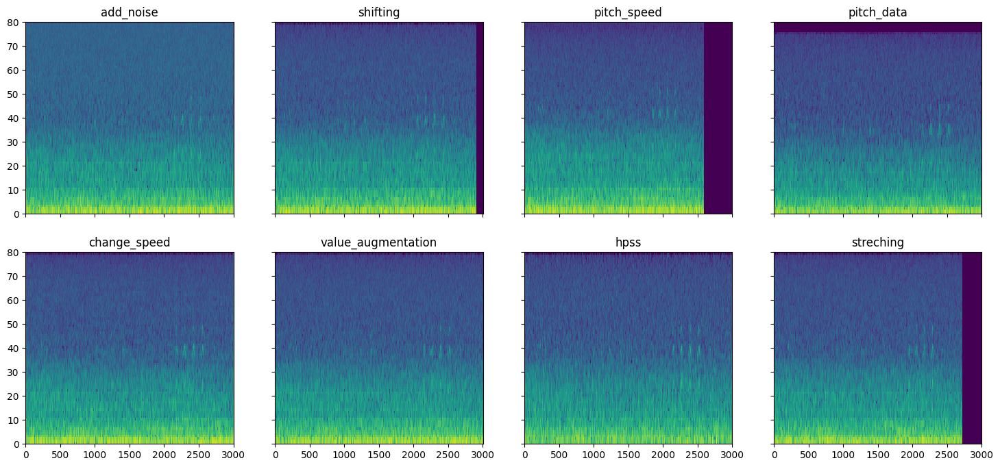

In [60]:
fig, ax = plt.subplots(nrows=2, ncols=4,figsize=(18, 8), sharey=True, sharex=True)
for fig_x, key in zip(ax.flatten(), aug):
    display(Audio(aug[key], rate=sampling_rate))
    imshow_(aug[key],  title=key, plt_ax=fig_x)

# Settings

In [18]:
class CFG:
    #спектрограммы генерируются для аудиоклипов такой длины
    audio_duration = 5.0

    #генерирует до указанного количества клипов в файле (кратно audio_duration) остатки длины аудиоклипа / audio_duration игнорируются
    max_clips_per_audio_file = 750
    image_size = 224

    #обрабатывает до этого количества аудиофайлов каждого вида
    max_audio_input_per_species = 750

    #setting this above 0 will cause processing to start at a folder after the first
    #useful for restarting / continuing in case of running out of time / crash (folders are processed alphabetically)
    start_at_folder_offset = 0

Напишем функцию для поиска птиц.

In [19]:
def bird_species_from_folder(path):
    if path.endswith('/'):
        path = path[:-1]

    last_folder = os.path.basename(path)
    primary_com_name = df.loc[df['SPECIES_CODE'] == last_folder, 'PRIMARY_COM_NAME']
    primary_com_name_str = primary_com_name.iloc[0] if not primary_com_name.empty else ''    
    return f'{primary_com_name_str} ({last_folder})'

# Save spectrograms (or preview)

In [20]:
def spectrograms_for_audio(dirname, filename, preview=False):

    audio_path = os.path.join(dirname, filename)
    audio_data, sr = librosa.load(audio_path, sr=None)
    total_duration = librosa.get_duration(path=audio_path)
    
    augmentations = [(noising, [audio_data, np.random.uniform(0,0.1)]), (shifting, [audio_data, sr, 0.8,'right']),
                     (pitch_speed, [audio_data]), (change_pitch, [audio_data, sr, np.random.randint(-5,5)]),
                     (change_speed,[audio_data]), (value_aug, [audio_data]), (hpss, [audio_data]), (streching, [audio_data])]
    
    aug = random.choices([True, False], weights=[0.3, 0.7])
    if aug:
        random_aug = random.randint(0, len(augmentations)-1)
        audio_data = augmentations[random_aug][0](*augmentations[random_aug][1])
    
    # Сколько полных сегментов audio_duration поместится в аудиофайл.
    num_segments = int(total_duration // CFG.audio_duration)
    if num_segments == 0: return 0
    if num_segments > CFG.max_clips_per_audio_file: num_segments = CFG.max_clips_per_audio_file
         
    for segment in range(num_segments):

        offset_samples = int(segment * CFG.audio_duration * sr)
        end_samples = int(offset_samples + CFG.audio_duration * sr)
        
        segment_data = audio_data[offset_samples:end_samples]
        
        S = librosa.feature.melspectrogram(y=segment_data, sr=sr, n_mels=128)
        S_db = librosa.amplitude_to_db(S, ref=np.max)
                
        #конвертировать данные спектрограммы непосредственно в изображение 
        normalized_array = (S_db - np.min(S_db)) / (np.max(S_db) - np.min(S_db))
        
        #установить цветовое сопоставление
        spectrogram_image = cm.magma(normalized_array)[:, :, :3]
        spectrogram_image = (spectrogram_image * 255).astype(np.uint8)
        spectrogram_image = Image.fromarray(spectrogram_image)
        
        #изменить размер и перевернуть (что соответствует исходному набору данных)
        spectrogram_image = spectrogram_image.resize((CFG.image_size, CFG.image_size), Image.ANTIALIAS)
        spectrogram_image = ImageOps.flip(spectrogram_image)
        
        if preview == True:
            display(Audio(data=segment_data, rate=sr))
            return spectrogram_image
        
        output_folder = os.path.join(image_train, os.path.basename(os.path.normpath(dirname)))
        if not os.path.exists(output_folder):
            os.makedirs(output_folder)

        base_filename = filename.replace('.ogg', '')
        output_filename = os.path.join(output_folder, f"{base_filename}_{int((segment + 1) * CFG.audio_duration):02d}.png")
        
        spectrogram_image.save(output_filename)

    return num_segments

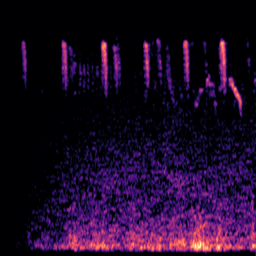

In [21]:
spectrograms_for_audio("/kaggle/input/birdclef-2024/train_audio/zitcis1/", "XC655341.ogg", preview=True)

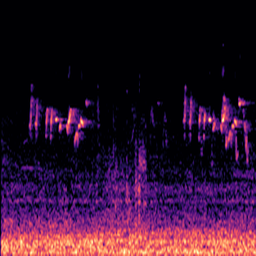

In [22]:
spectrograms_for_audio("/kaggle/input/birdclef-2024/train_audio/bkcbul1/", "XC129030.ogg", preview=True)

In [ ]:
spectrograms_for_audio("/kaggle/input/birdclef-2024/train_audio/asikoe2/", "XC138196.ogg", preview=True)

# Generate the spectrograms

In [ ]:
entries = os.listdir(audio_train)
subdirectories = [entry for entry in entries if os.path.isdir(os.path.join(audio_train, entry))]
subdirectories.sort()
subdirectories = subdirectories[CFG.start_at_folder_offset:]

for subdir in tqdm(subdirectories):
    subdir_path = os.path.join(audio_train, subdir)
    filenames = os.listdir(subdir_path)
    for filename in filenames[:CFG.max_audio_input_per_species]:
        images_generated = spectrograms_for_audio(subdir_path, filename)

ИСТОЧНИКИ:

 - https://academy.allaboutbirds.org/birdsong/
 - https://habr.com/ru/companies/skillfactory/articles/536834/
 - https://habr.com/ru/articles/647833/